In [1]:
# 简历描述：
# airbnb波士顿房源数据分析
# 数据清洗，查看数据的基本信息，对数据缺失值的处理
# EDA 部分，对单个字段的数据分布以及字段之间之间的关系进行了可视化展示并得出结论，
# 预测建模部分主要采用多种回归模型对数据集中的价格字段进行回归算法建模和预测以及结果对比

In [2]:
import pandas as pd
import numpy as np
import datetime

import matplotlib                  
import matplotlib.pyplot as plt
import seaborn as sns             
import geopandas as gpd            

import plotly as plotly               
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)

import folium
import folium.plugins

import sklearn
from sklearn import preprocessing
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor

In [3]:
df = pd.read_csv('AB_NYC_2019.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
df.shape

(48895, 16)

In [5]:
columns = df.columns 
columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [7]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

# 缺失值处理

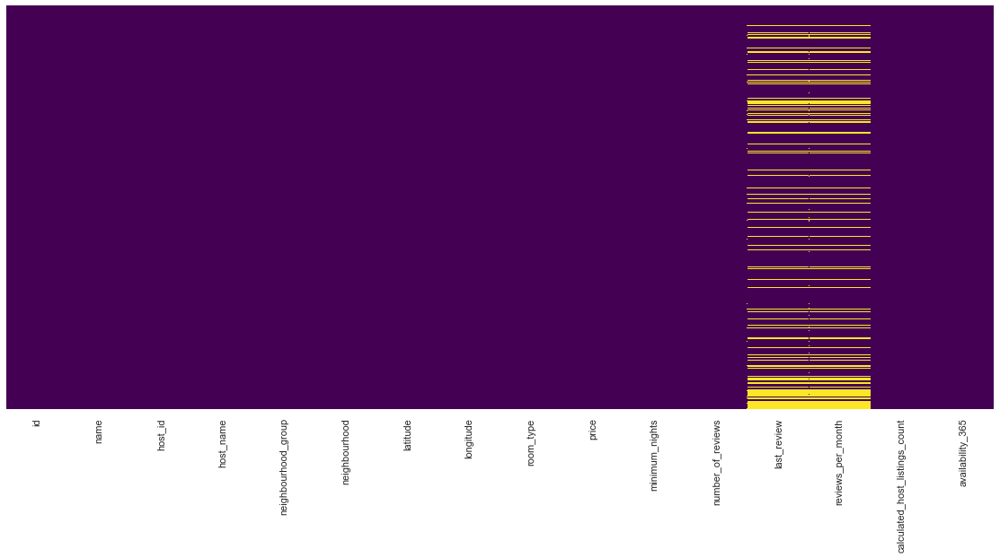

In [8]:
##
sns.set(rc={'figure.figsize':(19.7, 8.27)})
sns.heatmap(
  df.isnull(),
  yticklabels=False,
  cbar=False,
  cmap='viridis'
)

plt.show()

In [9]:
def to_today(date1):
    date2= datetime.datetime.strptime('2019-12-31',"%Y-%m-%d")
    if date1<date2:
        num=(date2-date1).days
        return num
    else:
        return 100000
df['last_review'] = pd.to_datetime(df['last_review'])
df['reviews_per_month'].fillna(0, inplace = True)
df['last_review_to_today'] = df['last_review'].apply(lambda x:to_today(x))
df.drop(['id','host_id','host_name','last_review'], axis=1, inplace=True)
df.shape

(48895, 13)

# 数据EDA exploratory data analysis 主要探索数据分布情况

/var/folders/vc/hp1kfbmj7lb7k9nhyd12slww0000gn/T/ipykernel_28145/1814037735.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




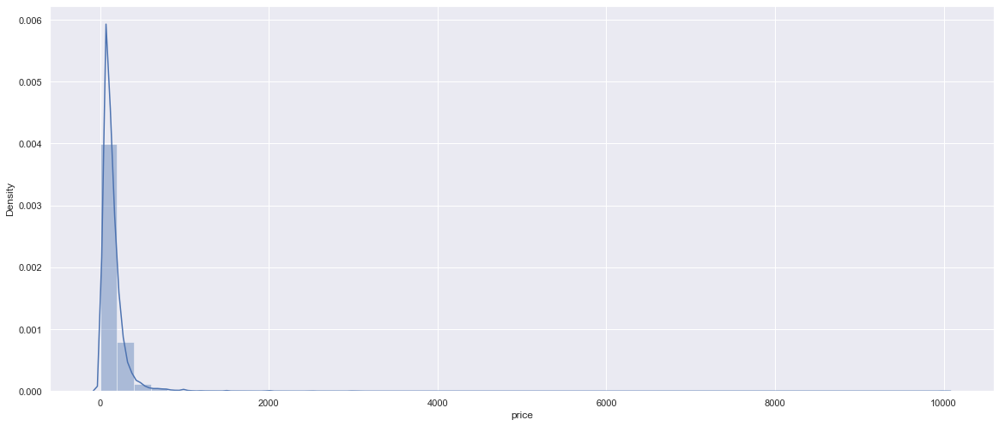

In [10]:
sns.distplot(df['price'])
plt.show()

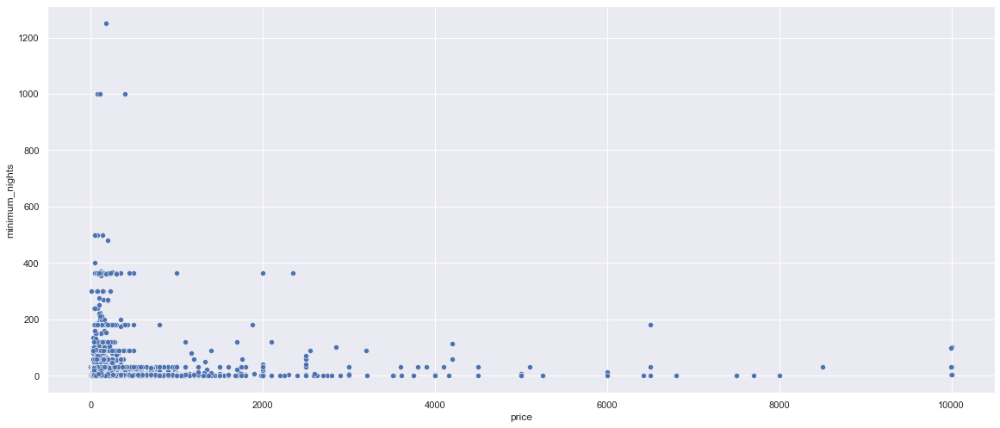

In [11]:
#查看价格和最低预订天数的关系
sns.scatterplot(x = "price",y = "minimum_nights", data = df)
plt.show()

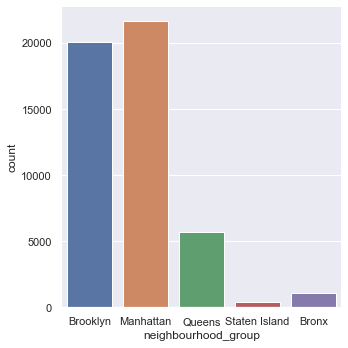

In [12]:
#查看房屋的区域
sns.catplot(x="neighbourhood_group", kind="count", data=df)
plt.show()

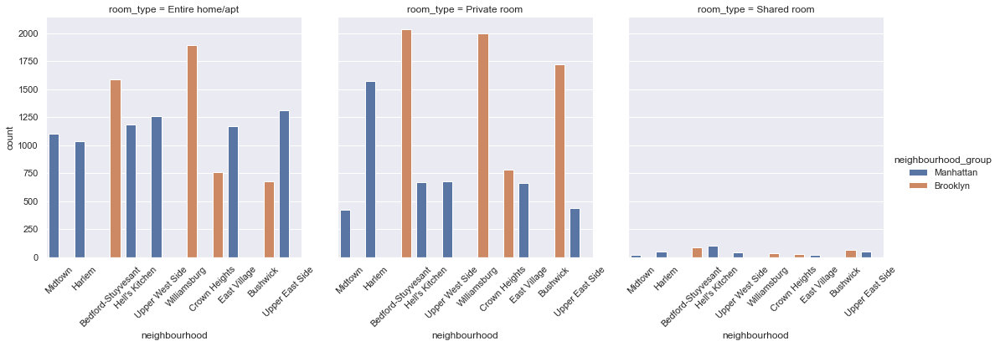

In [13]:
sns.catplot(x = 'neighbourhood', hue = 'neighbourhood_group', col = 'room_type', 
            data = df.loc[df['neighbourhood'].isin( df.neighbourhood.value_counts().head(10).index)],
            kind = 'count').set_xticklabels(rotation=45)

图中数据集占比分别为：97.47%, 100.00%, 93.77%, 93.50%,99.04%,76.54%,


<AxesSubplot:xlabel='neighbourhood_group', ylabel='last_review_to_today'>

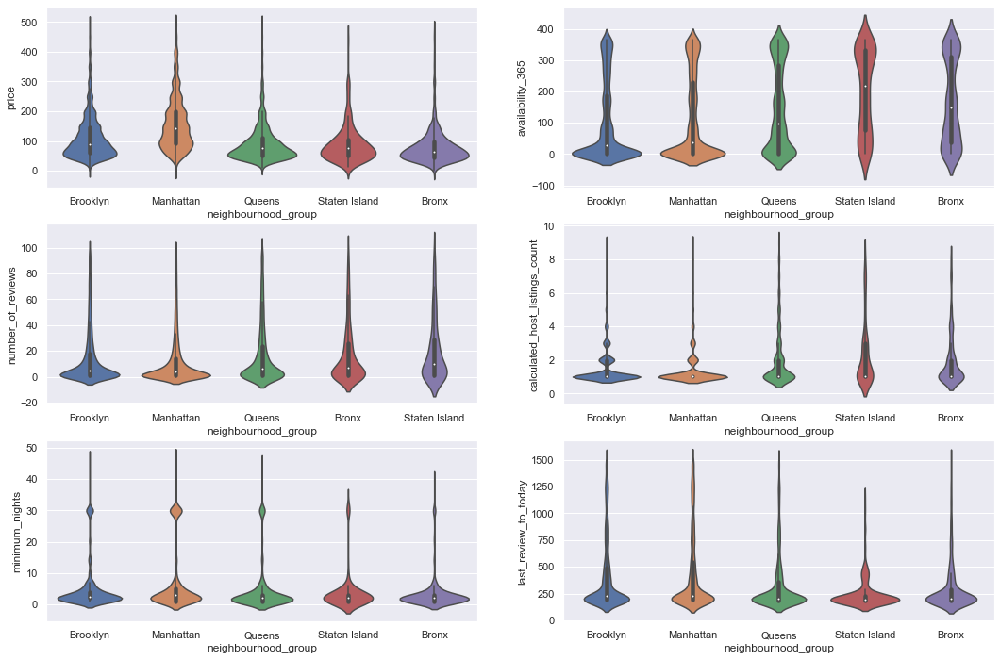

In [14]:
# 不同 Number Features 在不同 Category Features 中的分布情况
# 可用的 Number Features 主要有：latitude - longitude,price - minimum_nights,number_of_reviews,reviews_per_month
# calculated_host_listings_count,availability_365,last_review_to_today

fig=plt.figure(4,figsize=(18,12))
ax1=fig.add_subplot(3,2,1)
ax2=fig.add_subplot(3,2,2)
ax3=fig.add_subplot(3,2,3)
ax4=fig.add_subplot(3,2,4)
ax5=fig.add_subplot(3,2,5)
ax6=fig.add_subplot(3,2,6)

ax_1_per = 100*len(df[df.price<500])/len(df)
ax_2_per = 100*len(df)/len(df)
ax_3_per = 100*len(df[df.number_of_reviews<100])/len(df)
ax_4_per = 100*len(df[df.calculated_host_listings_count<10])/len(df)
ax_5_per = 100*len(df[df.minimum_nights < 50])/len(df)
ax_6_per = 100*len(df[df.last_review_to_today<1500])/len(df)

print('图中数据集占比分别为：%.2f%%, %.2f%%, %.2f%%, %.2f%%,%.2f%%,%.2f%%,' %(ax_1_per, ax_2_per, ax_3_per, ax_4_per, ax_5_per, ax_6_per))
sns.violinplot(x = 'neighbourhood_group', y = 'price',data = df[df.price<500], ax = ax1)
sns.violinplot(x = 'neighbourhood_group', y = 'availability_365',data = df, ax = ax2)
sns.violinplot(x = 'neighbourhood_group', y = 'number_of_reviews',data = df[df.number_of_reviews<100], ax= ax3)
sns.violinplot(x = 'neighbourhood_group', y = 'calculated_host_listings_count',data = df[df.calculated_host_listings_count<10], ax= ax4)
sns.violinplot(x = 'neighbourhood_group', y = 'minimum_nights',data = df[df.minimum_nights < 50], ax= ax5)
sns.violinplot(x = 'neighbourhood_group', y = 'last_review_to_today',data = df[df.last_review_to_today<1500], ax= ax6)


图中数据集占比分别为：97.47%, 100.00%, 93.77%, 93.50%,99.04%,76.54%,


<AxesSubplot:xlabel='room_type', ylabel='last_review_to_today'>

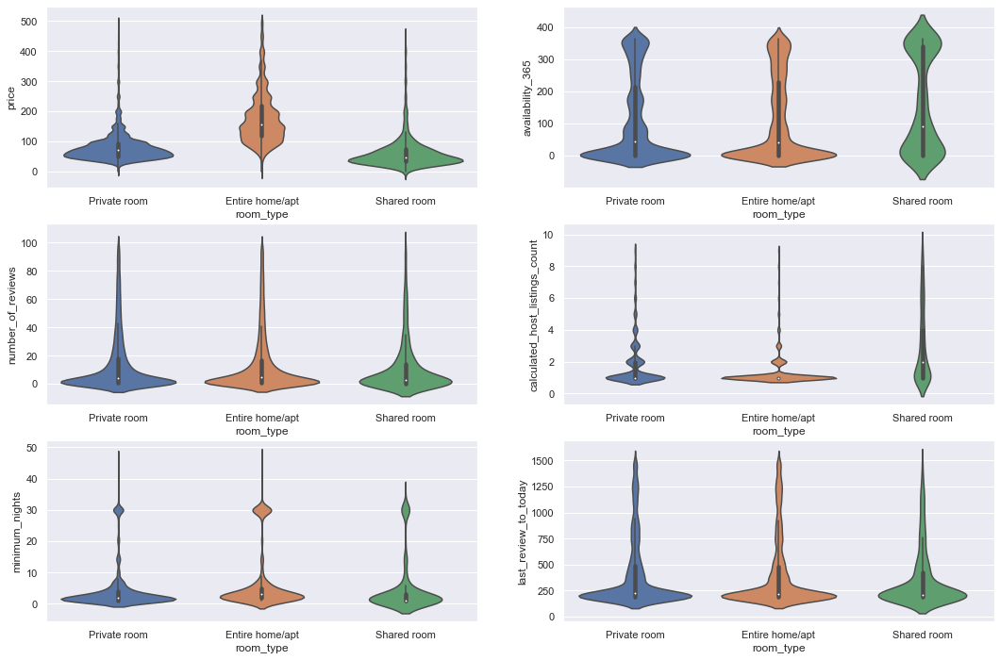

In [15]:
fig=plt.figure(4,figsize=(18,12))
ax1=fig.add_subplot(3,2,1)
ax2=fig.add_subplot(3,2,2)
ax3=fig.add_subplot(3,2,3)
ax4=fig.add_subplot(3,2,4)
ax5=fig.add_subplot(3,2,5)
ax6=fig.add_subplot(3,2,6)

ax_1_per = 100*len(df[df.price<500])/len(df)
ax_2_per = 100*len(df)/len(df)
ax_3_per = 100*len(df[df.number_of_reviews<100])/len(df)
ax_4_per = 100*len(df[df.calculated_host_listings_count<10])/len(df)
ax_5_per = 100*len(df[df.minimum_nights < 50])/len(df)
ax_6_per = 100*len(df[df.last_review_to_today<1500])/len(df)

print('图中数据集占比分别为：%.2f%%, %.2f%%, %.2f%%, %.2f%%,%.2f%%,%.2f%%,' %(ax_1_per, ax_2_per, ax_3_per, ax_4_per, ax_5_per, ax_6_per))
sns.violinplot(x = 'room_type', y = 'price',data = df[df.price<500], ax = ax1)
sns.violinplot(x = 'room_type', y = 'availability_365',data = df, ax = ax2)
sns.violinplot(x = 'room_type', y = 'number_of_reviews',data = df[df.number_of_reviews<100], ax= ax3)
sns.violinplot(x = 'room_type', y = 'calculated_host_listings_count',data = df[df.calculated_host_listings_count<10], ax= ax4)
sns.violinplot(x = 'room_type', y = 'minimum_nights',data = df[df.minimum_nights < 50], ax= ax5)
sns.violinplot(x = 'room_type', y = 'last_review_to_today',data = df[df.last_review_to_today<1500], ax= ax6)

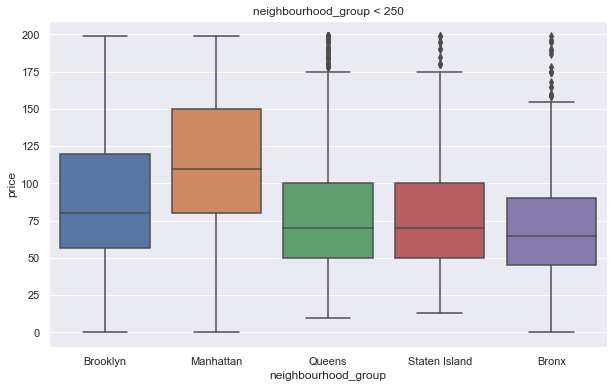

In [16]:
#箱型图
df1 = df[df.price < 200]   # 小于200房子较多
plt.figure(figsize=(10,6))

sns.boxplot(x = 'neighbourhood_group',
            y = 'price',
            data=df1
           )

plt.title("neighbourhood_group < 250")

plt.show()

Text(0.5, 1.05, 'Pearson Correlation of Number Features')

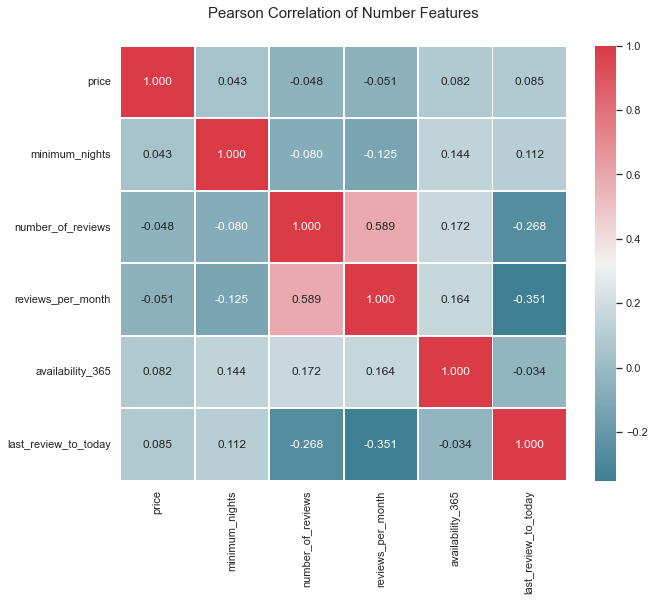

In [17]:
#number features之间的互相关系
num_field = [
'price',
'minimum_nights',
'number_of_reviews',
'reviews_per_month',
'availability_365',
'last_review_to_today',
]
f,ax = plt.subplots(figsize=(10, 8))
sns.heatmap(df[num_field].corr(),annot=True,
                    cmap = sns.diverging_palette(220, 10, as_cmap = True),
                    linewidths=.9, fmt= '.3f',ax = ax)
plt.title('Pearson Correlation of Number Features', y=1.05, size=15)


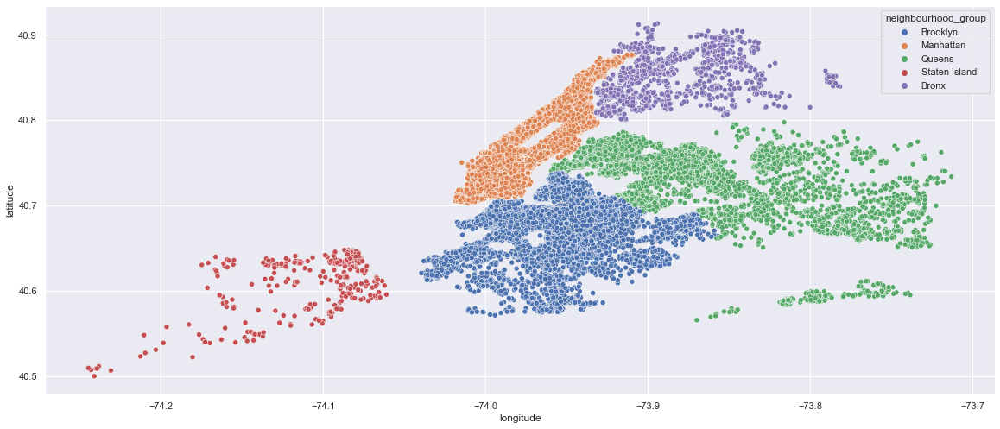

In [18]:
#房源的经纬度 按照不同区域划分
sns.scatterplot(x = "longitude",y = "latitude", hue=df.neighbourhood_group, data = df)
plt.show()

In [19]:
#房源分布热力图
import folium
from folium.plugins import HeatMap

m = folium.Map([40.70000,-74.00000],zoom_start=11)

HeatMap(df[['latitude','longitude']].dropna(),
        radius=10,
        gradient={0.2:'blue',
                  0.4:'purple',
                  0.6:'orange',
                  1.0:'red'}).add_to(m)
display(m)

In [20]:
df['room_type'].value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

In [21]:
import plotly.offline as pyo
import plotly.graph_objs as go

room_df = df.groupby("room_type").size()/df["room_type"].count()*100
room_df

room_type
Entire home/apt    51.966459
Private room       45.661111
Shared room         2.372431
dtype: float64

In [22]:
labels = room_df.index
values = room_df.values

fig = go.Figure(data=[go.Pie(labels=labels,
                             values=values,
                             hole=0.5
                            )])

fig.show()
##结论：整租或者公寓方式的房源占比最大，可能更受欢迎。

<Figure size 864x432 with 0 Axes>

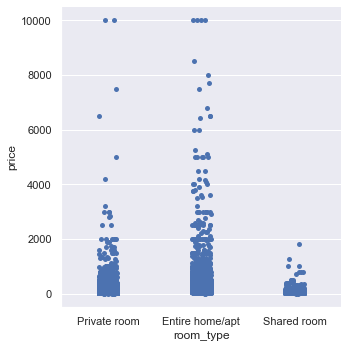

In [23]:
##房屋类型和价格关系
plt.figure(figsize=(12,6))
sns.catplot(data=df,x="room_type",y="price")
plt.show()

In [24]:
#名字中的关键词
# 将数据的名字全部装在列表names中
names = []
for name in df.name:
    names.append(name)  
    
def split_name(name):
    """作用：切割每个名字"""
    spl = str(name).split()
    return spl


names_count = []
for each in names:  # 循环列表names
    for word in split_name(each): # 每个名字实行切割操作
        word = word.lower()  # 统一变成小写
        names_count.append(word)  # 每次切割的结果放入列表中

# 计数库        
from collections import Counter
result = Counter(names_count).most_common()
result[:5]


[('in', 16733),
 ('room', 9389),
 ('bedroom', 7231),
 ('private', 6985),
 ('apartment', 6113)]

In [25]:
top_20 = result[0:20]  # 前20个的高频词语

top_20_words = pd.DataFrame(top_20, columns=["words","count"])
top_20_words


,words,count
0,in,16733
1,room,9389
2,bedroom,7231
3,private,6985
4,apartment,6113
5,cozy,4634
6,the,3869
7,to,3827
8,studio,3772
9,brooklyn,3629


[Text(0, 0, 'in'),
 Text(1, 0, 'room'),
 Text(2, 0, 'bedroom'),
 Text(3, 0, 'private'),
 Text(4, 0, 'apartment'),
 Text(5, 0, 'cozy'),
 Text(6, 0, 'the'),
 Text(7, 0, 'to'),
 Text(8, 0, 'studio'),
 Text(9, 0, 'brooklyn'),
 Text(10, 0, 'apt'),
 Text(11, 0, 'spacious'),
 Text(12, 0, '1'),
 Text(13, 0, 'with'),
 Text(14, 0, '2'),
 Text(15, 0, 'of'),
 Text(16, 0, 'east'),
 Text(17, 0, 'and'),
 Text(18, 0, 'manhattan'),
 Text(19, 0, '&')]

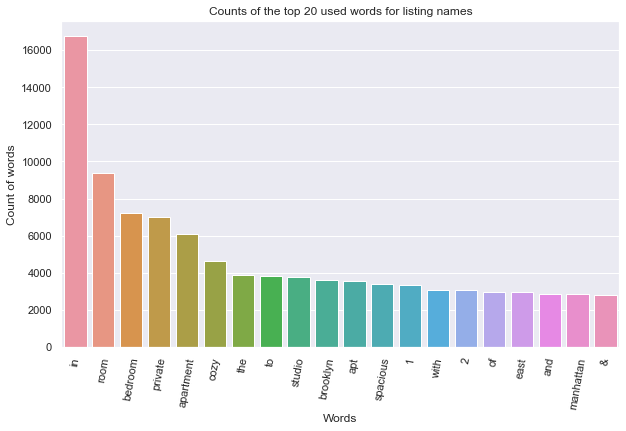

In [26]:
plt.figure(figsize=(10,6))

fig = sns.barplot(data=top_20_words,x="words",y="count")
fig.set_title("Counts of the top 20 used words for listing names")
fig.set_ylabel("Count of words")
fig.set_xlabel("Words")
fig.set_xticklabels(fig.get_xticklabels(), rotation=80)


In [27]:
##回访量统计
df1 = df.sort_values(by="number_of_reviews",ascending=False).head(1000)
df1.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_to_today
11759,Room near JFK Queen Bed,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333,179
2031,Great Bedroom in Manhattan,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293,193
2030,Beautiful Bedroom in Manhattan,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342,191
2015,Private Bedroom in Manhattan,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339,199
13495,Room Near JFK Twin Beds,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173,187


In [28]:
import folium
from folium.plugins import MarkerCluster
from folium import plugins

print("Rooms with the most number of reviews")


mapdf1 = folium.Map([40.70000,-74.00000], zoom_start=12)

mapdf1_rooms_map = plugins.MarkerCluster().add_to(mapdf1)

for lat, lon, label in zip(df1.latitude,df1.longitude,df1.name):
    folium.Marker(location=[lat, lon],icon=folium.Icon(icon="home"),
                 popup=label).add_to(mapdf1_rooms_map)

mapdf1.add_child(mapdf1_rooms_map)


Rooms with the most number of reviews


In [29]:
# plotly绘制可租天数
px.scatter(df,x="longitude",y="latitude",color="availability_365")

In [30]:
##price小于500的房间分布
low_500 = df[df.price < 500]
px.scatter(low_500,
           x='longitude',
           y='latitude',
           color='price'
          )

In [ ]:
# 小结：
# Airbnb订单主要集中在 Manhattan 和 Brooklyn，Queen 约为头部二者的一半，Bronx、Staten Island 地区订单数量极少
# Entire home/apt 类型房间产生订单最多，Private room 类型房间其次，Shared room 类型房间订单极少
# neighbourhood 长尾效应较为明显，第十位约为第一位的一半，共221个中，203个的计数值大于3
# 纽约各个行政区中，Manhattan 价格没有呈现集中趋势，各个区间分布均匀，其他几个区均有集中在60左右
# availability_365 整体呈现两端分布多，中间分布少的特点。在 Brooklyn 和 Manhattan 呈现出类似的分布，集中分布在0天左右，推测这两个区的Airbnb登记房主要为自住房，其他三个区首尾分布近似，自住与出租房占比接近
# number_of_reviews 依旧在 Brooklyn 和 Manhattan 呈现出类似的分布，房屋的评论数多集中在0-10之间，结合各个区域房屋数量，可以看到在 Brooklyn 和 Manhattan 由于房屋数量众多，住房和评论比较难出现集中的情况，而越是在房屋少的地区，越容易出现评论数分布集中的情况
# calculated_host_listings_count 依旧在 Brooklyn 和 Manhattan 呈现出类似的分布。用户在这两个区都有在订单集中在1、2次的情况，推测这两个区为旅游区，一次性的游客性质租客较多
# minimum_nights 在各个区的分布状况类似，主要集中分布在0-10天内，但 Manhattan 区约30左右分布明显较多，说明 Manhattan 的部分房屋有议价权，租赁条件较高，属于卖方市场
# last_review_to_today 为我们从 last_review 字段派生出来的计算字段，其中空值被我们设为默认值100000。从分布看，最后一次评论时间都集中在约200天前，即 2019/06 左右。Staten Island 分布最为集中且最大约为1200，即2016/09左右，其他地区均早已出现评论，推测 Airbnb 在此地区用户较少，或短期租房需求较少

# Private room 与 Shared room 在价格分布上近似，集中在50左右，而按常理讲 Entire Home/apt 面积更大，所以价格更高，整体分布平缓不少，高价房间也较多
# availability_365 在 Private room 与 Entire Home/apt 分布近似，可用时间主要集中在0-50天之间，而 Shared room 则呈现两头分布的情况，推测出租 Shared room 的用户属于常驻人口，且对于隐私敏感性较低
# number_of_reviews 在三个 room_type 的分布情况类似，均呈现在0-10之间的集中分布
# calculated_host_listings_count在 Entire Home/apt 集中趋势明显，显然这种价格较高、面积较大的房屋更适于全家出游，故而租赁次数只有1次的用户最多；在 Private room 的分布平缓很多，但仍然主要集中在0-5次之间；而 Shared room 中已经很平缓，推测可能是住此类房间的客户人数较少，或住此类房间的客户有着订单数目多的特点，需要高频率的在 Airbnb 上租赁，而价格较为低廉的 Shared room 成为了他们的首选
# minimum_nights 在三个 room_type 的分布情况类似，主要集中于0-10之间，在30左右有部分集中。其中 Private room 在0-10之间分布最集中，Entire Home/apt 在30日左右集中分布最多，推测可能是由于私人房间出租时有短期随机性（出差），搬离、清洁成本较低，而全套整租成本高，搬离、清洁成本也较高，需要长租来减少边际成本，获得更大利润
# last_review_to_today 在 Private room 与 Entire Home/apt 分布近似，Shared room 不集中且较大值少
# 从热力图可以看出，没有字段有强相关，这对于机器学习来说是一个好消息
# 目前相关性最强的两组字段为：number_of_review 和 reviews_per_month 正相关，last_review_to_today 和 reviews_per_month 负相关。
# reviews_per_month 由 number_of_review 计算生成，相关性差异主要由于月份影响；last_review_to_today 和 reviews_per_month 可以理解为评论距今的时间越长，月均评论数越少。
# 有可能是我们对 last_review_to_today 缺失默认值的处理导致这样的情况出现

# 回归预测

In [31]:
df.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_to_today
0,Clean & quiet apt home by the park,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,438
1,Skylit Midtown Castle,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,224
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,100000
3,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,179
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,407


In [32]:
#线性回归建模
df.drop("name",inplace=True,axis=1)


In [33]:
#编码类型转化
cols = ["neighbourhood","room_type"]

for col in cols:
    le = preprocessing.LabelEncoder()
    le.fit(df[col])
    df[col] = le.transform(df[col])
    
df.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_to_today
0,Brooklyn,108,40.64749,-73.97237,1,149,1,9,0.21,6,365,438
1,Manhattan,127,40.75362,-73.98377,0,225,1,45,0.38,2,355,224
2,Manhattan,94,40.80902,-73.94190,1,150,3,0,0.00,1,365,100000
3,Brooklyn,41,40.68514,-73.95976,0,89,1,270,4.64,1,194,179
4,Manhattan,61,40.79851,-73.94399,0,80,10,9,0.10,1,0,407


In [34]:
df['new_col'] = df['room_type'].apply(lambda x: x * 0)
df.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_to_today,new_col
0,Brooklyn,108,40.64749,-73.97237,1,149,1,9,0.21,6,365,438,0
1,Manhattan,127,40.75362,-73.98377,0,225,1,45,0.38,2,355,224,0
2,Manhattan,94,40.80902,-73.94190,1,150,3,0,0.00,1,365,100000,0
3,Brooklyn,41,40.68514,-73.95976,0,89,1,270,4.64,1,194,179,0
4,Manhattan,61,40.79851,-73.94399,0,80,10,9,0.10,1,0,407,0


In [35]:
for row in df.itertuples():
    if row.neighbourhood_group == "Manhattan":
        df.at[row.Index, 'new_col'] = 1
    elif row.neighbourhood_group == "Brooklyn":
        df.at[row.Index, 'new_col'] = 2
    elif row.neighbourhood_group == "Queens":
        df.at[row.Index, 'new_col'] = 3
    elif row.neighbourhood_group == "Bronx":
        df.at[row.Index, 'new_col'] = 4
    elif row.neighbourhood_group == "Staten Island":
        df.at[row.Index, 'new_col'] = 5

In [36]:
#价格预测

# 模型实例化
lm = LinearRegression()
dt = DecisionTreeRegressor()
rf = RandomForestRegressor()
xgb = XGBRegressor()

# 数据集
X = df.drop(["price","neighbourhood_group"],axis=1)
y = df["price"]

# 训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

lm.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [37]:
#测试集验证
lm_predicts = lm.predict(X_test)
dt_predicts = dt.predict(X_test)
rf_predicts = rf.predict(X_test)
xgb_predicts = xgb.predict(X_test)

lm_dt = mean_squared_error(y_test, lm_predicts)
mse_dt = mean_squared_error(y_test, dt_predicts)
mse_rf = mean_squared_error(y_test, rf_predicts)
mse_xgb = mean_squared_error(y_test, xgb_predicts)
print(lm_dt,mse_dt,mse_rf,mse_xgb)

error_airbnb = pd.DataFrame({
    "Actual":np.array(y_test).tolist(),
    "lm_predicts":lm_predicts.tolist(),
    "dt_predicts":dt_predicts.tolist(),
    "rf_predicts":rf_predicts.tolist(),
    "xgb_predicts":xgb_predicts.tolist()
})

error_airbnb.head()

57441.039099752874 114151.1059413028 57427.59935595381 55757.11662737212


,Actual,lm_predicts,dt_predicts,rf_predicts,xgb_predicts
0,99,76.603601,99.0,86.22,73.414322
1,40,40.808117,55.0,59.70,53.889664
2,149,167.994889,190.0,145.90,163.834244
3,80,109.155740,80.0,102.75,113.291672
4,95,193.332954,150.0,175.09,124.016983


In [38]:
#对比预测值和真实值，做出二者的差值diff（增加字段）
error_airbnb["lm_diff"] = error_airbnb["lm_predicts"] - error_airbnb["Actual"]
error_airbnb["dt_diff"] = error_airbnb["dt_predicts"] - error_airbnb["Actual"]
error_airbnb["rf_diff"] = error_airbnb["rf_predicts"] - error_airbnb["Actual"]
error_airbnb["xgb_diff"] = error_airbnb["xgb_predicts"] - error_airbnb["Actual"]
px.box(error_airbnb,y="lm_diff")
px.box(error_airbnb,y="dt_diff")
px.box(error_airbnb,y="rf_diff")

#真实值和预测值在有些数据中差别很大

In [39]:
error_airbnb.describe()
##有的居然相差了9978（绝对值），属于异常值的情况；四分之一的中位为-16，差值为16，整体上二者还是较为接近

,Actual,lm_predicts,dt_predicts,rf_predicts,xgb_predicts,lm_diff,dt_diff,rf_diff,xgb_diff
count,9779.000000,9779.000000,9779.000000,9779.000000,9779.000000,9779.000000,9779.000000,9779.000000,9779.000000
mean,155.206872,153.093558,156.986297,157.035646,153.117569,-2.113313,1.779425,1.828774,-2.089303
std,252.671119,74.701724,278.607475,133.473089,126.067586,239.671540,337.875145,239.645838,236.132279
min,0.000000,-134.324628,10.000000,23.680000,-66.826912,-9723.907972,-9683.000000,-9698.780000,-9750.563141
25%,69.000000,96.203492,70.000000,77.245000,75.109970,-16.785541,-30.000000,-11.520000,-17.542297
50%,106.000000,157.203623,108.000000,130.240000,130.195465,24.695460,0.000000,12.880000,11.536114
75%,175.000000,209.295950,180.000000,198.755000,194.709770,65.134476,35.000000,42.430000,41.349907
max,10000.000000,334.769793,10000.000000,4631.670000,3588.175537,251.235102,9854.000000,2829.870000,2814.819824
